# Introduction

Optimization lies at the heart of machine learning algorithms, and gradient descent is one of the most commonly used optimization techniques. When dealing with functions of multiple variables, understanding how gradient descent navigates the parameter space to find the minima is crucial.

In this notebook, we will:
* Explore the mathematical formulation of multivariable gradient descent.
* Implement the algorithm from scratch.
* Visualize the optimization path on a contour plot.
* Analyze how different learning rates affect convergence.

By the end of this notebook, I hope you'll have a deeper appreciation for the mechanics of gradient descent in multiple dimensions and how it can be applied to complex machine learning models.

![A](https://egallic.fr/Enseignement/ML/ECB/book/figs/example_two_dim/descent_2D_sphere.gif)

# 1.) Importing Libraries

We begin by importing the necessary Python libraries that will facilitate our computations and visualizations.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import plotly.graph_objs as go

# 2.) Defining the Multivariable Cost Function and Gradient

Let's consider a simple quadratic function of two variables: 

$ f(x) = f(x, y) = (x - 2)^2 + (y + 3)^2 $

This function represents a paraboloid in three-dimensional space and has its global minimum at $ (x, y) = (2,−3)$.

## Gradient Computation
The gradient vector $ ∇f(x)$ points in the direction of the steepest ascent. It is given by the partial derivatives of $ f $ with respect to each variable:

$\nabla f(x) = \left( 
\frac{\partial f}{\partial x}, 
\frac{\partial f}{\partial y} 
\right) = \left( 
2(x - 2), 2(y + 3) 
\right)$

The following code implements our paraboloid cost function and its corresponding gradient vector:

In [2]:
#Define the cost function
def cost_function(x, y):
    return (x - 2)**2 + (y + 3)**2

#Gradient of the cost function
def gradient(x, y):
    grad_x = 2 * (x - 2)
    grad_y = 2 * (y + 3)
    return np.array([grad_x, grad_y])

# 3.) Visualizing the Cost Function

To better understand the landscape of our cost function, we'll visualize it using both 3D and 2D visualizations.

## Creating the Meshgrid

We generate a grid of 𝑥 and 𝑦 values over a specified range to compute the corresponding 𝑧 values of the cost function.

In [3]:
#Create meshgrid for the surface plot
x = np.linspace(-6, 6, 400)
y = np.linspace(-6, 6, 400)
X, Y = np.meshgrid(x, y)
Z = cost_function(X, Y)

## Plotting the 3D Interactive Plot

In [4]:
#Surface plot
surface = go.Surface(x = X, y = Y, z = Z, colorscale = 'jet', opacity = 0.8)

#Layout for 3D visualization
layout = go.Layout(
    title = 'Interactive 3D Surface Plot of f(x, y)',
    scene = dict(
        xaxis_title = 'X-axis',
        yaxis_title = 'Y-axis',
        zaxis_title = 'f(x, y)',
    ),
)

# Create the figure
fig = go.Figure(data=[surface], layout=layout)

# Show the interactive plot
fig.show()

## Plotting the 2D Contour Map
The contour lines represent points of equal cost. The center of the contours at $ (2,−3) $ indicates the global minimum.

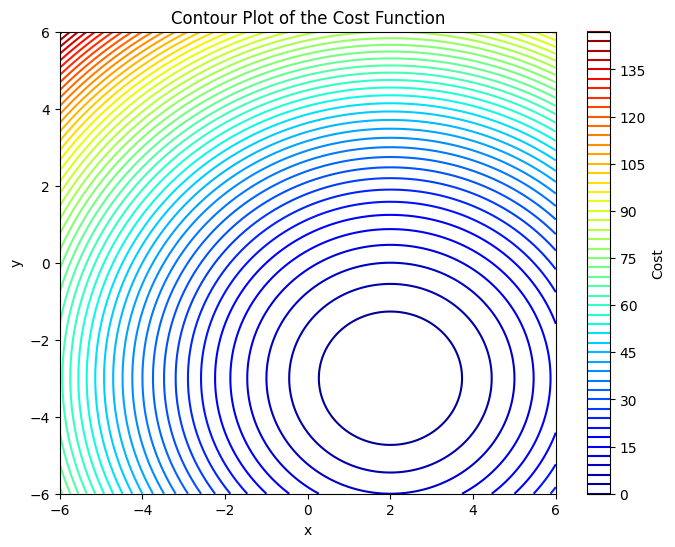

In [5]:
#Plot the contour of the function
plt.figure(figsize = (8,6))
plt.contour(X, Y, Z, levels = 50, cmap = 'jet')
plt.title('Contour Plot of the Cost Function')
plt.xlabel('x')
plt.ylabel('y')
plt.colorbar(label='Cost')
plt.show()

# 4.) Implementing Multivariable Gradient Descent

Now, we'll implement the gradient descent algorithm to find the minimum of our cost function.

## Gradient Descent Algorithm

The update rule for gradient descent in multiple dimensions is: 

$x_{k+1} = x_k - \alpha \nabla f(x_k)$

Where:

* $x_{k}$ is the current position in parameter space.
* $\alpha $ is the learning rate.
* $ \nabla f(x_k) $ is the gradient at $x_{k}$.

## Implementation

We initialize 𝑥 and 𝑦 with random values to simulate starting from different points. The learning rate 𝛼 is set to 0.5 but can be adjusted. We store the history of $(x, y)$ to visualize the path taken by the algorithm.

In [6]:
#Multivariable Gradient Descent
def gradient_descent_multivar(learning_rate = 0.5, num_iterations = 50):
    x = np.random.randn()  #Random starting point for x
    y = np.random.randn()  #Random starting point for y
    
    history = [(x, y)]  #Keep track of (x, y) pairs for visualization
    
    for i in range(num_iterations):
        grad = gradient(x, y)  #Calculate the gradient
        x = x - learning_rate * grad[0]  #Update x
        y = y - learning_rate * grad[1]  #Update y
        history.append((x, y))  #Store the new (x, y)
        
        #Print the first few iterations
        if i < 5:
            print(f"Iteration {i+1}: x = {x}, y = {y}, f(x, y) = {cost_function(x, y)}")

    return history

#Run gradient descent and store the path
path = gradient_descent_multivar(learning_rate = 0.5, num_iterations = 50)

Iteration 1: x = 2.0, y = -3.0, f(x, y) = 0.0
Iteration 2: x = 2.0, y = -3.0, f(x, y) = 0.0
Iteration 3: x = 2.0, y = -3.0, f(x, y) = 0.0
Iteration 4: x = 2.0, y = -3.0, f(x, y) = 0.0
Iteration 5: x = 2.0, y = -3.0, f(x, y) = 0.0


# 5.) Visualizing the Gradient Descent Path

By plotting the sequence of $(x,y)$ points over the contour plot, we can observe how gradient descent navigates towards the minimum.

In [7]:
#Surface plot
surface = go.Surface(x = X, y = Y, z = Z, colorscale = 'jet', opacity = 0.7)

#Gradient descent path (as a 3D scatter plot)
path = np.array(path)
path_trace = go.Scatter3d(
    x = path[:, 0],
    y = path[:, 1],
    z = cost_function(path[:, 0], path[:, 1]),
    mode = 'markers+lines',
    marker = dict(color='red', size = 5),
    line = dict(color='red', width = 2),
    name = 'Gradient Descent Path'
)

#Layout
layout = go.Layout(
    title = 'Interactive 3D Surface Plot of f(x, y) with Gradient Descent Path',
    scene = dict(
        xaxis_title = 'X-axis',
        yaxis_title = 'Y-axis',
        zaxis_title = 'f(x, y)',
    ),
)

#Create the figure
fig = go.Figure(data = [surface, path_trace], layout = layout)

#Show the interactive plot
fig.show()

## Extracting the Path Coordinates

In [8]:
#Extract x and y from path history
x_path = [p[0] for p in path]
y_path = [p[1] for p in path]

## Plotting the Path Over the Contour Map

Key Insights:
* The red dots represent the positions at each iteration.
* The path illustrates how the algorithm moves in the direction opposite to the gradient.
* The steps become smaller as the algorithm approaches the minimum.

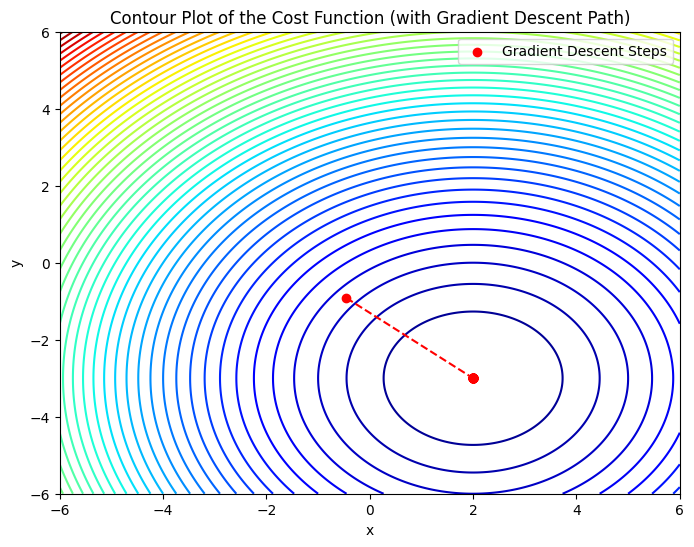

In [9]:
#Plot the contour of the function
plt.figure(figsize = (8,6))
plt.contour(X, Y, Z, levels = 50, cmap = 'jet')

#Plot the gradient descent steps
plt.scatter(x_path, y_path, color = 'red', label = 'Gradient Descent Steps')
plt.plot(x_path, y_path, color = 'red', linestyle = '--')

plt.title('Contour Plot of the Cost Function (with Gradient Descent Path)')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()

# 6.) Analyzing Convergence

Understanding how the cost function value changes over iterations provides insights into the convergence behavior of the algorithm.

## Cost Function Over Iterations

In [10]:
#Calculate the cost at each step of the gradient descent
cost_values = [cost_function(x, y) for x, y in path]

## Plotting Cost vs. Iterations

Key Observations:
* The cost function decreases monotonically, indicating proper convergence.
* The rate of decrease is initially significant in the first few iterations of the gradient descent algorithm. 
* The rate of decrease slows down dramatically as the algorithm approaches the minimum.

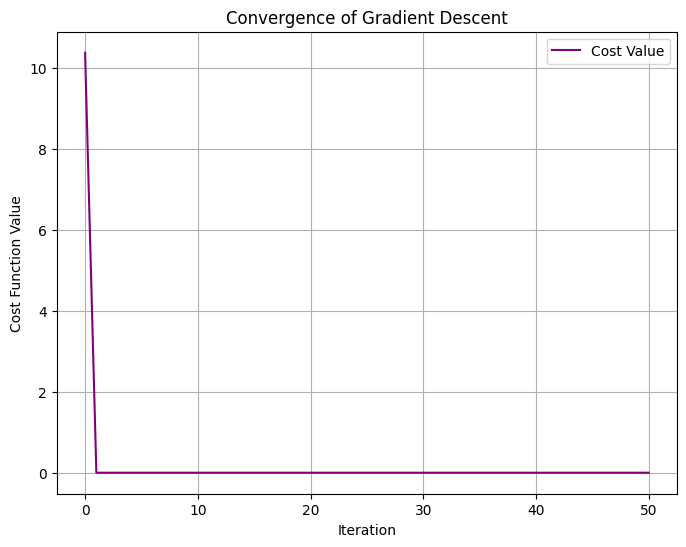

In [11]:
#Plot the cost function value over iterations
plt.figure(figsize = (8,6))
plt.plot(range(len(cost_values)), cost_values, color = 'purple', label = 'Cost Value')
plt.title('Convergence of Gradient Descent')
plt.xlabel('Iteration')
plt.ylabel('Cost Function Value')
plt.grid(True)
plt.legend()
plt.show()

# 7.) Interactive Exploration of Learning Rates

The choice of learning rate 𝛼 is critical. An inappropriate learning rate can lead to slow convergence or divergence.

## Interactive Widget Setup

We will use *ipywidgets* to create an interactive slider that allows you to adjust the learning rate and observe its effect on the optimization path.

In [12]:
import ipywidgets as widgets
from IPython.display import display

## Defining the Interactive Function

In [13]:
#Function to explore gradient descent with varying learning rates
def explore_multivar_gradient_descent(learning_rate):
    path = gradient_descent_multivar(learning_rate=learning_rate, num_iterations=50)
    x_path = [p[0] for p in path]
    y_path = [p[1] for p in path]
    
    #Plot the contour and the gradient descent path
    plt.figure(figsize = (10, 8))
    plt.contour(X, Y, Z, levels=50, cmap='viridis')
    plt.scatter(x_path, y_path, color='red', label='Gradient Descent Steps')
    plt.plot(x_path, y_path, color='red', linestyle='--')
    plt.title(f'Gradient Descent Path with Learning Rate {learning_rate}')
    plt.xlabel('x')
    plt.ylabel('y')
    plt.legend()
    plt.show()

## Creating the Slider

In [14]:
#Interactive slider for learning rate
learning_rate_slider = widgets.FloatSlider(value = 0.5, min = 0.01, max = 1.0, step = 0.01, description='Learning Rate:')
widgets.interact(explore_multivar_gradient_descent, learning_rate=learning_rate_slider)

interactive(children=(FloatSlider(value=0.5, description='Learning Rate:', max=1.0, min=0.01, step=0.01), Outp…

<function __main__.explore_multivar_gradient_descent(learning_rate)>

## Experimentation

From experimentation, here are the results:

* Small Learning Rates (𝛼 < 0.5): The gradient descent algorithm converges slowly, requiring more iterations.
* Optimal Learning Rate (𝛼 ≈ 0.5): The gradient descent algorithm balances both convergence speed and stability.
* Large Learning Rates  (𝛼 > 0.5): The gradient descent algorithm may overshoot and diverge.

# Conclusion

In this notebook, we've explored the mechanics of multivariable gradient descent:

* **Mathematical Foundation**: We derived the gradient for a simple quadratic function and implemented the gradient descent update rule.
* **Visualization**: By plotting the optimization path over a contour map, we gained intuitive insights into how the algorithm navigates the cost landscape.
* **Learning Rate Impact**: Through interactive exploration, we observed how the learning rate affects convergence speed and stability.

## Key Takeaways:
* **Gradient Direction**: Gradient descent moves in the direction opposite to the gradient, aiming to reduce the cost function.
* **Learning Rate (𝛼)**: A crucial hyperparameter that controls the step size. It must be carefully chosen to balance convergence speed and stability.
* **Convergence Behavior**: The cost function value decreases over iterations, ideally converging to the global minimum.

## Ideas for Further Exploration:
* **Higher Dimensions**: Extend the implementation to functions with more variables to simulate real-world machine learning models.
* **Adaptive Learning Rate**s: Implement algorithms like AdaGrad, RMSProp, or Adam that adjust the learning rate during training.
* **Non-Convex Functions**: Explore gradient descent on non-convex functions to understand challenges like local minima and saddle points.

![](https://slidechef.net/wp-content/uploads/2024/06/Innovative-Thank-You-Wallpaper.jpg)

*This notebook was crafted to provide both practical implementation and theoretical insights into multivariable gradient descent, aiming to enhance your machine learning toolkit.*